# Import Libraries

In [1]:
# common modules
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn

# preprocessing, clustering, PCA
from sklearn.preprocessing import MinMaxScaler, StandardScaler, MaxAbsScaler, RobustScaler
import plotly.express as px
from sklearn.cluster import MiniBatchKMeans, KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN

# EDA

In [2]:
data = pd.read_csv('CC GENERAL.csv', index_col = 'CUST_ID') # Set the customer's ID as index
print(data.shape)
data.head()

(8950, 17)


,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
CUST_ID,,,,,,,,,,,,,,,,,
C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [3]:
data.isna().sum()

BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

It's shown that CREDIT_LIMIT only has 1 missing value, which can simply be removed from the dataset

MINIMUM_PAYMENTS has 313 missing values, that should be treated specifically

### CREDIT_LIMIT

In [4]:
data.dropna(subset = ['CREDIT_LIMIT'], inplace = True)

### MINIMUM_PAYMENTS

In [5]:
data[['PAYMENTS', 'MINIMUM_PAYMENTS']][data['MINIMUM_PAYMENTS'].isna()]

,PAYMENTS,MINIMUM_PAYMENTS
CUST_ID,,
C10004,0.000000,NaN
C10047,0.000000,NaN
C10049,0.000000,NaN
C10056,417.016763,NaN
C10057,0.000000,NaN
...,...,...
C19160,0.000000,NaN
C19170,0.000000,NaN
C19176,0.000000,NaN


It is pretty obvious that customers who haven't done any payments wouldn't have minimum payments also
<br>
Hence, **if PAYMENTS = 0, MINIMUM_PAYMENTS = 0**

In [6]:
# Looking at PAYMENTS that's above MINIMUM_PAYMENTS

print('Shape:', data[['PAYMENTS', 'MINIMUM_PAYMENTS']][(data['MINIMUM_PAYMENTS'].notna()) & (data['PAYMENTS'] > data['MINIMUM_PAYMENTS'])].shape)
data[['PAYMENTS', 'MINIMUM_PAYMENTS']][(data['MINIMUM_PAYMENTS'].notna()) & (data['PAYMENTS'] > data['MINIMUM_PAYMENTS'])].head()

Shape: (6272, 2)


,PAYMENTS,MINIMUM_PAYMENTS
CUST_ID,,
C10001,201.802084,139.509787
C10002,4103.032597,1072.340217
C10005,678.334763,244.791237
C10007,6354.314328,198.065894
C10008,679.065082,532.033990


In [7]:
# Looking at PAYMENTS that's below MINIMUM_PAYMENTS

print('Shape:', data[['PAYMENTS', 'MINIMUM_PAYMENTS']][(data['MINIMUM_PAYMENTS'].notna()) & (data['PAYMENTS'] < data['MINIMUM_PAYMENTS'])].shape)
data[['PAYMENTS', 'MINIMUM_PAYMENTS']][(data['MINIMUM_PAYMENTS'].notna()) & (data['PAYMENTS'] < data['MINIMUM_PAYMENTS'])].head()

Shape: (2364, 2)


,PAYMENTS,MINIMUM_PAYMENTS
CUST_ID,,
C10003,622.066742,627.284787
C10006,1400.057770,2407.246035
C10011,1083.301007,2172.697765
C10015,805.647974,989.962866
C10016,1993.439277,2109.906490


Logically, payments should be done if PAYMENTS above MINIMUM_PAYMENTS. Which is true for **6272** customers.
<br> But on the other hand, we got **2364** customers who did the PAYMENTS below MINIMUM_PAYMENTS which lead to invalid values. But we would like to leave it that way.
<br> Hence, we **fill the missing values by the mean of PAYMENTS**
<br> **if PAYMENTS is less than MINIMUM_PAYMENTS, the missing values will be filled by the correspond PAYMENTS**

In [8]:
minpay = data['MINIMUM_PAYMENTS'].copy() # make a copy of MINIMUM_PAYMENTS
payments_mean = np.mean(data['PAYMENTS']) # take the mean value of PAYMENTS

i = 0
for payments, minpayments in zip(data['PAYMENTS'], data['MINIMUM_PAYMENTS'].isna()):
    if (payments == 0) and (minpayments == True):
        minpay[i] = 0
    elif (0 < payments < payments_mean) and (minpayments == True): 
        minpay[i] = payments
    elif minpayments == True: # sisanya diisi oleh mean
        minpay[i] = payments_mean
    i += 1
    
data['MINIMUM_PAYMENTS'] = minpay.copy()

In [9]:
# Final check of missing values presence:

data.isna().sum()

BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

## Taking a glance at the data distributions

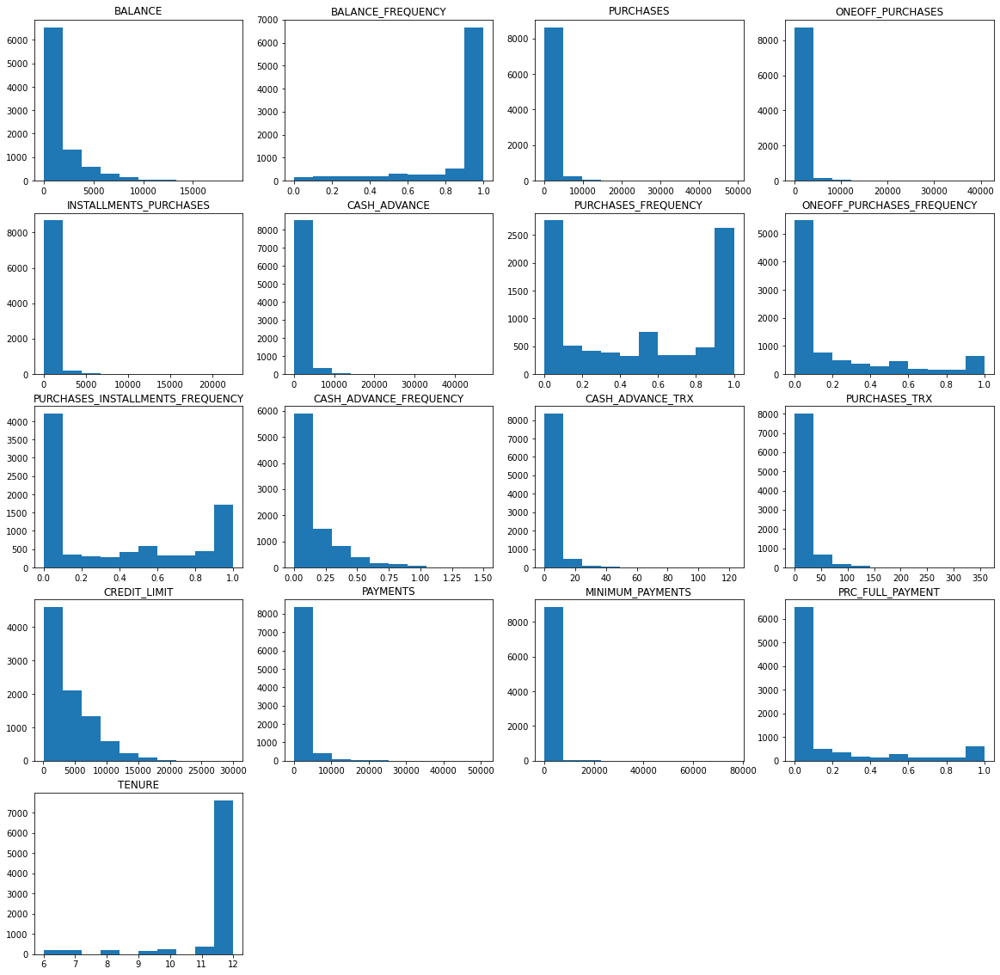

In [10]:
fig, axs = plt.subplots(nrows=5, ncols=4, figsize = (20,20))

z = 0
for i in range(5):
    for j in range(4):
        if z > 16:
            axs[i][j].axis(False)
        else:
            axs[i][j].set_title(data.iloc[:,z].name)
            axs[i][j].hist(data.iloc[:,z])
        z+=1

Turns out every feature has outliers. But this doesn't mean that we will delete the outliers, because it's possible that all of these values do happen on the field. <br> 
Hence, the treatment that will be applied is to do **logarithmic scale** for each features. <br>

Logarithmic scale is used because, mathematically huge numbers will be kept much smaller without losing the meaning of the data.

In [11]:
logscaled_data = np.log2(data + 0.01)
logscaled_data.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
CUST_ID,,,,,,,,,,,,,,,,,
C10001,5.354408,-0.271980,6.576069,-6.643856,6.576069,-6.643856,-2.500896,-6.643856,-3.421469,-6.643856,-6.643856,1.007196,9.965799,7.656869,7.124326,-6.643856,3.586164
C10002,11.644973,-0.121720,-6.643856,-6.643856,-6.643856,12.653507,-6.643856,-6.643856,-6.643856,-1.943416,2.003602,-6.643856,12.773141,12.002478,10.066560,-2.106423,3.586164
C10003,11.284916,0.014355,9.594661,9.594661,-6.643856,-6.643856,0.014355,0.014355,-6.643856,-6.643856,-6.643856,3.586164,12.872677,9.280949,9.293000,-6.643856,3.586164
C10004,10.702762,-0.629581,10.549794,10.549794,-6.643856,7.685085,-3.421469,-3.421469,-6.643856,-3.421469,0.014355,0.014355,12.872677,-6.643856,-6.643856,-6.643856,3.586164
C10005,9.675471,0.014355,4.000901,4.000901,-6.643856,-6.643856,-3.421469,-3.421469,-6.643856,-6.643856,-6.643856,0.014355,10.228831,9.405875,7.935467,-6.643856,3.586164


## Trying different scalers:
- MinMaxScaler
- StandardScaler
- RobustScaler
- MaxAbsScaler

### MinMaxScaler

MinMax Scaling is a scaler that is highly influenced by the maximum and minimum values in our data so if our data contains outliers it is going to be biased.
MinMaxScaler rescales the data set in such a way that all features values are in the range [0, 1]. This is done by feature-wise in an independent way.

In [12]:
minMaxScaler = MinMaxScaler().fit_transform(logscaled_data)

### StandardScaler
StandardScaler is a scaler that move the whole dataset into the center/origin point and scaling it, which results in 0 Mean and 1 Standard Deviation 

In [13]:
standardScaler = StandardScaler().fit_transform(logscaled_data)

### RobustScaler
RobustScaler behaves similar to MinMaxScaler, but instead of using its Minimum and Maximum values, RobustScaler uses the 1sr and 3rd Quartile. With this way, data won't be affected by the presence of Outliers (huge number)

In [14]:
robustScaler = RobustScaler().fit_transform(logscaled_data)

### MaxAbsScaler
MaxAbsScaler scales the data by the Absolute and Maximum number. So the presence of massive negative numbers will become 1

In [15]:
maxAbsScaler = MaxAbsScaler().fit_transform(logscaled_data)

# Principal Component Analysis
Principal component analysis is a technique for feature extraction — so it combines our input variables in a specific way, then we can drop the “least important” variables while still retaining the most valuable parts of all of the variables
This is a benefit because the assumptions of a linear model require our independent variables to be independent of one another.

So after having 4 different scaled data, we will use it against PCA and choose which one results in good cluster in 3D Scatter Plot

### 1. PCA with MinMaxScaler 

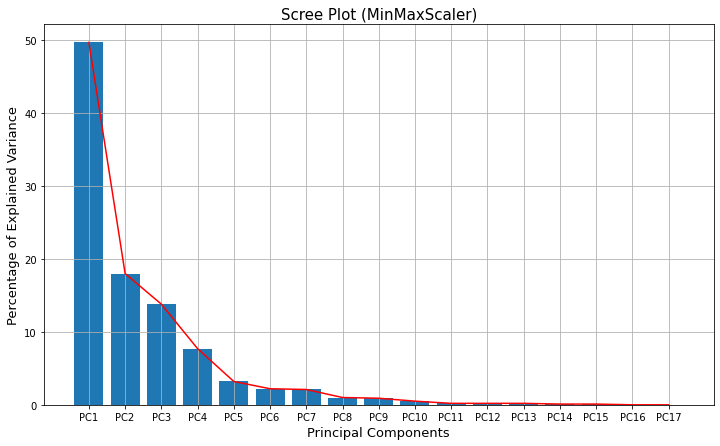

81.5% variance of the dataset lies on the first 3 Principal Components


In [17]:
pca = PCA(n_components = 17)
pca.fit(minMaxScaler)
pca_data = pca.transform(minMaxScaler)

def scree_plot(pca, scaler):
    per_var = np.round(pca.explained_variance_ratio_* 100, decimals=1)
    labels = ['PC' + str(x) for x in range(1, len(per_var)+1)]

    plt.figure(figsize = (12,7))
    plt.bar(x = range(1,len(per_var)+1), height = per_var, tick_label = labels)
    plt.plot(range(1,len(per_var)+1), per_var, c = 'red')
    plt.ylabel('Percentage of Explained Variance', size = 13)
    plt.xlabel('Principal Components', size = 13)
    plt.title('Scree Plot (%s)' %(scaler), size = 15)
    plt.grid()
    plt.show()
    print('%s%% variance of the dataset lies on the first 3 Principal Components'  %(np.sum(per_var[:3])))

scree_plot(pca, 'MinMaxScaler')

In [18]:
def scatter_plot3D(pca_data):
    x, y, z = pca_data[:,:3].T
    fig = px.scatter_3d(x = x, 
                        y = y, 
                        z = z)
    fig.show()
    
scatter_plot3D(pca_data)

<img src = "./images/pca_1.png"> 

Data scatters is clustered very clearly, which can be seen as 7 clusters

### 2. PCA with StandardScaler

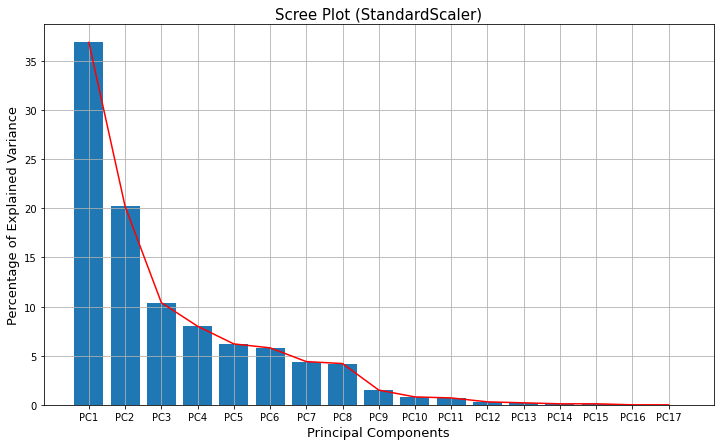

67.5% variance of the dataset lies on the first 3 Principal Components


In [19]:
pca = PCA(n_components = 17)
pca.fit(standardScaler)
pca_data = pca.transform(standardScaler)

scree_plot(pca, 'StandardScaler')

In [20]:
scatter_plot3D(pca_data)

<img src = "./images/pca_2.png"> 

Data is not clustered very clear, much skewed to the negative values

### 3. PCA with RobustScaler

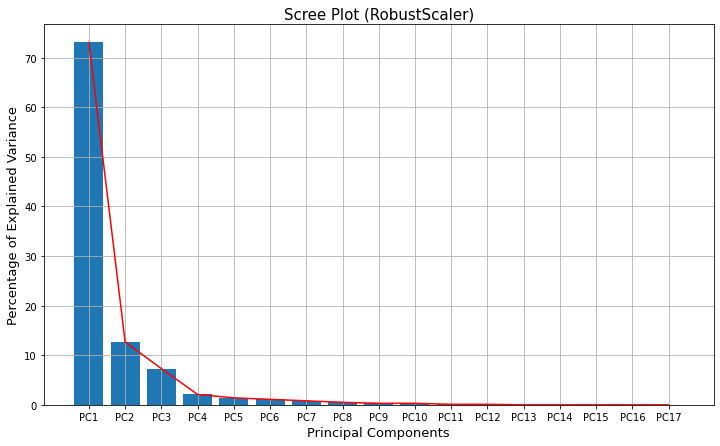

93.1% variance of the dataset lies on the first 3 Principal Components


In [21]:
pca = PCA(n_components = 17)
pca.fit(robustScaler)
pca_data = pca.transform(robustScaler)

scree_plot(pca, 'RobustScaler')

In [22]:
scatter_plot3D(pca_data)

<img src = "./images/pca_3.png"> 

Data obviously not clustered very well. Looks like some data is heavily skewed

### 4. PCA with MaxAbsScaler

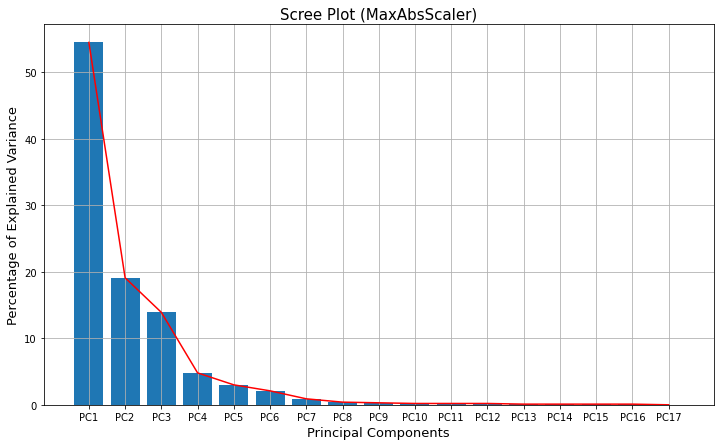

87.5% variance of the dataset lies on the first 3 Principal Components


In [23]:
pca = PCA(n_components = 17)
pca.fit(maxAbsScaler)
pca_data = pca.transform(maxAbsScaler)

scree_plot(pca, 'MaxAbsScaler')

In [24]:
scatter_plot3D(pca_data)

<img src = "./images/pca_4.png"> 

This results behave similar to MinMaxScaler, but around each clusters are surrounded by some unclustered data, which likely to be an anomoly that doesn't cluster well

#### Conclusion:
MinMaxScaler did the best for resulting in good shape of clusters, and also have big value of 3 Principal Components which is 81.5%<br> Hence:

In [26]:
pca = PCA(n_components = 17)
pca.fit(minMaxScaler)
pca_data = pca.transform(minMaxScaler)
top3_pc = pca_data[:,:3]

# Clustering

Clustering method will be done with K-Means Clustering, K-Medoids, and DBSCAN

### 1. K-Means Clustering
K-means clustering is a type of unsupervised learning, which is used with unlabeled dataset. The goal of this algorithm is to find K groups in the data. The algorithm works iteratively to assign each data point to one of K groups based on the features that are provided.
<br>

Choosing K
If the true label is not known in advance, then K-Means clustering can be evaluated using Elbow Criterion , Silhouette Coefficient , cross-validation, information criteria, the information theoretic jump method, and the G-means algorithm. 

In [27]:
inertia = []
silh = []

for i in range(2,10):
    kmeans = KMeans(n_clusters = i) 
    kmeans.fit(top3_pc)
    inertia.append(kmeans.inertia_)
    silh.append(silhouette_score(top3_pc, kmeans.labels_))

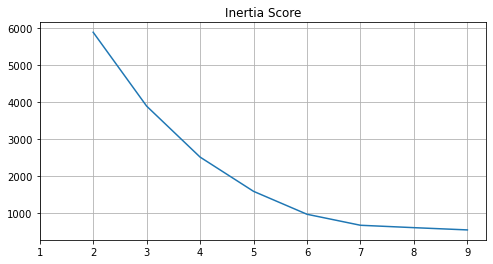

In [28]:
plt.figure(figsize = (8,4))
plt.plot(range(2,10), inertia)
plt.title('Inertia Score')
plt.xticks(range(1,10))
plt.grid()
plt.show()

Elbow Criterion Method:
The idea behind elbow method is to run k-means clustering on a given dataset for a range of values of k (e.g k=1 to 10), for each value of k, calculate sum of squared errors (SSE).

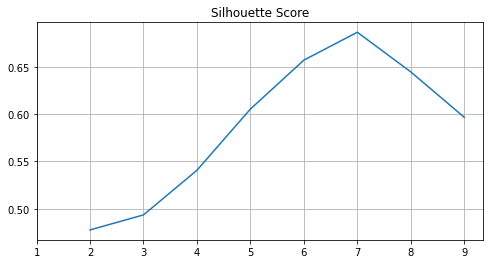

In [29]:
plt.figure(figsize = (8,4))
plt.plot(range(2,10), silh)
plt.title('Silhouette Score')
plt.xticks(range(1,10))
plt.grid()
plt.show()

Silhouette Coefficient Method:
A higher Silhouette Coefficient score relates to a model with better-defined clusters. The Silhouette Coefficient is defined for each sample and is composed of two scores:
The mean distance between a sample and all other points in the same class.
The mean distance between a sample and all other points in the next nearest cluster.

#### Conclusion:
<br> 7 Clusters is chosen, because the elbow is positioned at 7th cluster, and the highest value in Silhouetter Score is also positioned at 7th cluster

In [30]:
# Choosing cluster = 7

kmeans = KMeans(n_clusters=7)
kmeans.fit(top3_pc)
kmeans_labels = kmeans.labels_

In [31]:
x, y, z = top3_pc.T

fig = px.scatter_3d(x = x, 
                    y = y, 
                    z = z,
                    color = kmeans_labels)
fig.show()

<img src = "./images/eda_kmeans.png"> 

## DBSCAN
DBSCAN stands for density-based spatial clustering of applications with noise. It is able to find arbitrary shaped clusters and clusters with noise (i.e. outliers).
The main idea behind DBSCAN is that a point belongs to a cluster if it is close to many points from that cluster.

In [32]:
dbscan = DBSCAN(eps = 0.2) # eps = 0.2 is achieved iteratively to get the most reasonable number of clusters.
dbscan.fit(top3_pc)
dbscan_labels = dbscan.labels_ # label/cluster setiap instance

In [33]:
x, y, z = top3_pc.T

fig = px.scatter_3d(x = x, 
                    y = y, 
                    z = z,
                    color = dbscan_labels)
fig.show()

<img src = "./images/eda_dbscan.png"> 

# Conclusion
In K-Means Clustering, few datas is miss-clustered. Because in K-Means algorithm itself, it uses Euclidean Distance which in short, it measure how likely a data is clustered to its nearest cluster. WHereas in DBSCAN, it uses what so-called Epsilon, which is the radius parameter. Meaning that datas that nearer with each other will be clusterd in one.

Hence, **MinMaxScaler and DBSCAN will be used for Data Processing in the future**